In [1]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import geopandas as gpd


pd.options.display.max_columns = 999
pd.options.display.max_rows = 999
pd.options.display.max_colwidth = 100


import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from matplotlib import rc


import plotly.express as px

from paths import *
from scripts import vis_simulaCovid

import yaml


## SimulaCovid API ('http://datasource.coronacidades.org:7000/')
- br/states/rt
- br/cities/embaixadores
- br/cities/cnes
- world/owid/heatmap
- br/cities/farolcovid/main
- br/cities/rt
- br/cities/simulacovid/main
- br/cities/cases/full
- br/states/farolcovid/main


### RT

In [2]:
#load br cities
geo_sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
# cols = ['geocodigo','nome_mesorregiao','geometry']
cols = ['geocodigo','nome_mesorregiao','nome_municipio']
geo_sp = geo_sp[cols]

In [3]:
#load state data
url  = 'http://datasource.coronacidades.org/'
data = 'br/states/rt'

ds = pd.read_csv(f'{url}{data}')

ds['last_updated'] = pd.to_datetime(ds['last_updated'])

sp = ds[ds['state']=='SP']
sp = sp.rename(columns={'state':'city_id'})
sp['nome_mesorregiao'] = 'SP'
sp['nome_municipio']   = 'Estado de SP'

rj = ds[ds['state']=='RJ']
rj = rj.rename(columns={'state':'city_id'})
rj['nome_mesorregiao'] = 'RJ'
rj['nome_municipio']   = 'Estado do RJ'

mg = ds[ds['state']=='MG']
mg = mg.rename(columns={'state':'city_id'})
mg['nome_mesorregiao'] = 'MG'
mg['nome_municipio']   = 'Estado de MG'

am = ds[ds['state']=='AM']
am = am.rename(columns={'state':'city_id'})
am['nome_mesorregiao'] = 'AM'
am['nome_municipio']   = 'Estado de AM'

In [4]:
#load cities data
data = 'br/cities/rt'

df = pd.read_csv(f'{url}{data}')

df['last_updated'] = pd.to_datetime(df['last_updated'])


In [5]:

dd = df.merge(geo_sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd.head()

regiao = 'Vale do Paraíba Paulista'
mask = (dd['nome_mesorregiao']==regiao)
vale = dd[mask]
vale = vale[vale['city_id'].notnull()]

mask = (dd['nome_municipio']=='São Paulo')
sp_city = dd[mask]


vale = pd.concat([vale,sp_city], 0)
vale = pd.concat([vale,sp], 0)
vale = pd.concat([vale,rj], 0)
vale = pd.concat([vale,mg], 0)
vale = pd.concat([vale,am], 0)

In [6]:
def plot_rt_final(df_final,col,N_COLS):
    
    N_ROWS = int(np.ceil(len(df_final[col].unique()) / N_COLS))

    # opening figura
    fig, axes = plt.subplots(nrows=N_ROWS, ncols=N_COLS, figsize=(15, N_ROWS*3), dpi=400)

    for i, (city, result) in enumerate(df_final.groupby(col,sort=False)):
        ax = axes.flat[i]
        vis_simulaCovid.plot_rt(result, ax, city)
    fig.tight_layout()
    fig.set_facecolor('w')
    
    return fig

In [7]:
len(vale['nome_municipio'].unique())

38

In [8]:
vale.sort_values(by='last_updated', ascending=False).head()

,city_id,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed,geocodigo,nome_mesorregiao,nome_municipio
279,AM,2020-07-07,0.88,0.82,0.91,2020-07-08 12:11:18,NaN,AM,Estado de AM
25997,3.5482e+06,2020-07-07,1.83,1.16,2.42,2020-07-08 13:35:48,3548203.0,Vale do Paraíba Paulista,Santo Antônio do Pinhal
2468,SP,2020-07-07,0.99,0.96,1.01,2020-07-08 12:11:18,NaN,SP,Estado de SP
5928,3.50996e+06,2020-07-07,2.96,0.77,6.47,2020-07-08 13:35:48,3509957.0,Vale do Paraíba Paulista,Canas
5825,3.5097e+06,2020-07-07,1.20,0.89,1.47,2020-07-08 13:35:48,3509700.0,Vale do Paraíba Paulista,Campos do Jordão


In [9]:
fig = plot_rt_final(ds,'state',3)
fig.savefig("/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Estados.pdf.pdf", bbox_inches='tight')

In [10]:
last_date = max(vale['last_updated']).strftime('%d-%m-%Y')

fig = plot_rt_final(vale,'nome_municipio',4)

fig.savefig(f"/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Vale do Paraíba e Litoral Norte.pdf", bbox_inches='tight')

## Selected cities

In [11]:
## Rt for most recent date
max_date = max(vale['last_updated'])
vale_last_date = vale.drop_duplicates('nome_municipio', keep='last').sort_values(by='Rt_most_likely')
last_date = max_date.strftime('%Y-%m-%d')
fig = vis_simulaCovid.plot_rt_bars(vale_last_date, title= f'Taxa Transmissão Efetiva em {last_date}', place_type='nome_municipio')

In [12]:
fig = fig.update_xaxes(tickangle=30)
fig.write_image(f"/home/m/Downloads/Taxa Transmissão Efetiva em {last_date}.pdf", width=1080, height=720)

In [13]:
fig

In [14]:
vale_last_date['nome_municipio']

1793                Estado do RJ
279                 Estado de AM
27475                  São Paulo
2468                Estado de SP
24936               Santa Branca
11612                    Igaratá
27688              São Sebastião
7766                    Cruzeiro
27079        São José dos Campos
15485                  Lavrinhas
11775                   Ilhabela
14575                   Jambeiro
15945                     Lorena
20085                  Paraibuna
14284                    Jacareí
5825            Campos do Jordão
1027                Estado de MG
5019          Cachoeira Paulista
10591              Guaratinguetá
6267               Caraguatatuba
4934                    Caçapava
24257                    Roseira
30280                    Ubatuba
27188     São Luiz do Paraitinga
29642                    Taubaté
21273            Pindamonhangaba
18630        Natividade da Serra
26197       São Bento do Sapucaí
7904                       Cunha
29944                   Tremembé
22725     

In [15]:
municipios = ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Jambeiro','Roseira','Ubatuba']
vale_filtered = vale[vale['nome_municipio'].isin(municipios)]



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(vale_filtered, themes)

fig

## BR

In [16]:
br = pd.read_csv('../../brasil_geodata/maps/br_municipios_ibge.csv')
br = br[['geocodigo','nome_municipio','nome_uf']]

br_rt_full = df.copy()
br_rt_full = br.merge(br_rt_full, how='right', left_on = 'geocodigo', right_on = 'city_id')




br_rt = br_rt_full.sort_values(by='last_updated', ascending=False).groupby(by='city_id', as_index=False).first().sort_values(by='Rt_most_likely', ascending=True)




In [17]:
br_rt.head(3)

,city_id,geocodigo,nome_municipio,nome_uf,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed
292,1600303,1600303,Macapá,Amapá,2020-07-07,0.63,0.55,0.69,2020-07-08 13:35:48
2705,3304557,3304557,Rio de Janeiro,Rio de Janeiro,2020-07-07,0.67,0.63,0.70,2020-07-08 13:35:48
229,1505536,1505536,Parauapebas,Pará,2020-07-07,0.71,0.63,0.78,2020-07-08 13:35:48


In [18]:
municipios = br_rt.head(3)['nome_municipio'].tolist() + ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Assis']

In [19]:
br_rt_filtered = br_rt_full[br_rt_full['nome_municipio'].isin(municipios)].sort_values(by='last_updated')



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(br_rt_filtered, themes)

fig

## RT MAP

In [ ]:
#load br cities
sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
cols = ['geocodigo','nome_mesorregiao','geometry']
sp = sp[cols]

In [ ]:
#load data
url  = 'http://datasource.coronacidades.org:7000/'
data = 'br/cities/farolcovid/main'

df = pd.read_csv(f'{url}{data}')

dd = df.merge(sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd = gpd.GeoDataFrame(dd)


regiao = 'Vale do Paraíba Paulista'
mask = dd['nome_mesorregiao']==regiao
vale = dd[mask]

vale = gpd.GeoDataFrame(vale)

In [116]:
def plot_map(dd,var):
    fig = plt.figure(figsize=(25,25))
    ax  = fig.add_subplot(1,1,1)
    ax.set_title(f'{var}', fontsize=23)


    missings={
        "color": "white",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Missing values",
    }


    # dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[0.75,1]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,100,500,1000,10000]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[1,5,10,50,100,500,1000,3000]},missing_kwds=missings )
    dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,30,50,70]},missing_kwds=missings )

#     dd.plot(column=var ,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff" ,missing_kwds=missings, scheme='quantiles',k=30)

    ax.axis('off')


    plt.rc('legend',fontsize='large')

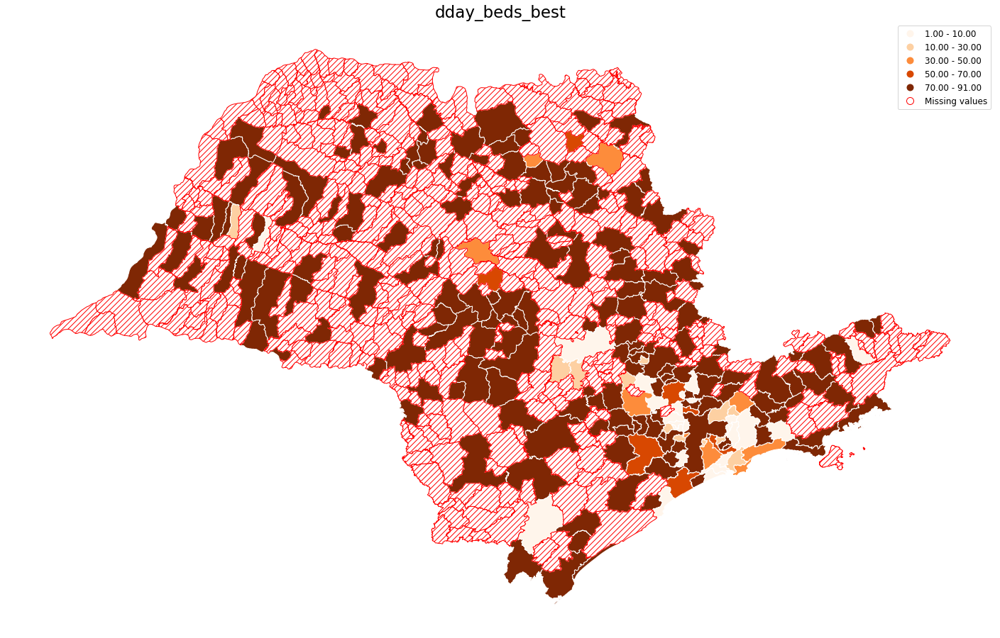

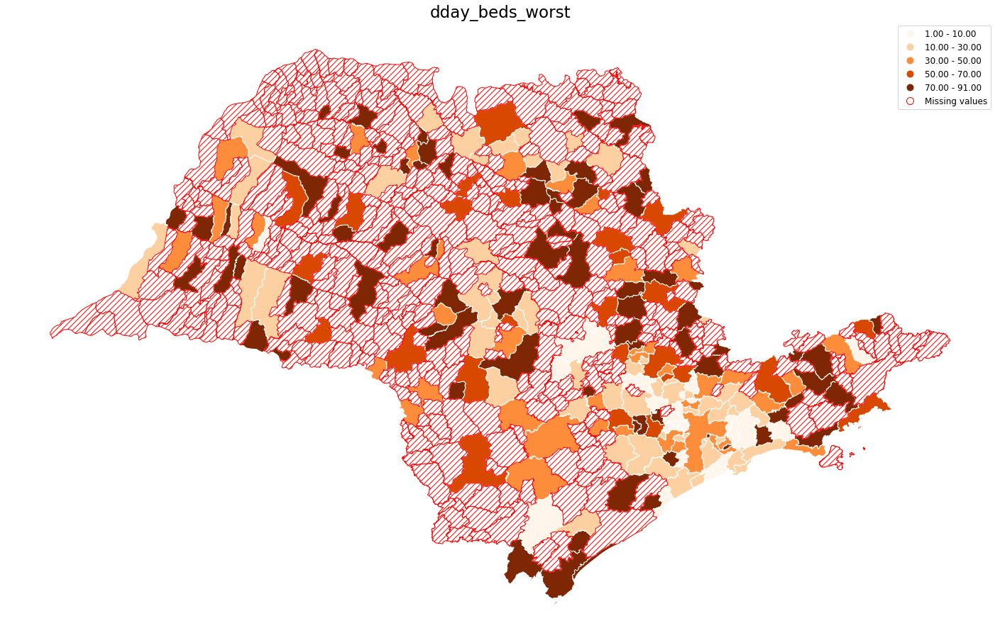

In [117]:
var = 'dday_beds_best'

plot_map(dd,var)


var = 'dday_beds_worst'

plot_map(dd,var)



# var = 'rt_10days_ago_avg'

# plot_map(dd,var)

# var = 'rt_ratio_week_avg'

# plot_map(dd,var)